<h1 align="center">Volume 2: The Fourier Transform.</h1>

    Bryant McArthur
    Sec 002
    December 2

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [25]:
from matplotlib import pyplot as plt
from scipy.io import wavfile
import numpy as np
import IPython
from scipy.fftpack import fft,fftfreq,ifft,fft2,ifft2
from scipy.signal import fftconvolve
from math import ceil,floor
import os
from imageio import imread

In [3]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [11]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        
        self.rate = int(rate)
        self.samples = samples
        
        

    # Problems 1.1 and 1.7
    def plot(self, bool = False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        
        #If True then plot the DFT as well
        if bool:
            dft = fft(self.samples)
            
            #Find period number of samples and domain of dft
            T = 1/self.rate
            N = len(self.samples)
            x = fftfreq(N,T)[:N//2]
            
            second = len(self.samples)/self.rate
            time = np.linspace(0,second,len(self.samples))
            
            #Plot it
            plt.subplot(121)
            plt.plot(time,self.samples)
            plt.ylim(-32768,32768)
            plt.xlabel("Seconds")
            
            plt.subplot(122)
            plt.plot(x,np.abs(dft[0:N//2]))
            plt.xlabel("frequency (Hz)")
            plt.xlim(0,6000)
            
            plt.show()
        
        else:
            #Get the upper limit
            second = len(self.samples)/self.rate
            #Find the domain
            time = np.linspace(0,second,len(self.samples))
            #Plot it
            plt.plot(time,self.samples)
            plt.ylim(-32768,32768)
            plt.xlabel("Seconds")

            plt.show()

    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        
        samptype = self.samples.dtype
        
        #If not the right type or if we are forcing a scaling then do both
        if samptype != np.int16:
            self.samples  = np.int16((self.samples / np.abs(np.max(self.samples))) * 32767)
        
        if force == True:
            self.samples  = np.int16((self.samples / np.abs(np.max(self.samples))) * 32767)
            
        #Write it to the specified file
        wavfile.write(filename, self.rate, self.samples)
        
        
    
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        #Raise an error if the sample arrays are not the same length
        if len(self.samples) != len(other.samples):
            raise ValueError("The sample arrays are not the same length")
        
        new = self.samples + other.samples
        
        return SoundWave(self.rate,new)
        

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #Return an error if the rates are not equal, else append the other wave to the first
        if self.rate != other.rate:
            raise ValueError("Rates are not equal")
            
        new = np.append(self.samples,other.samples)
        
        return SoundWave(self.rate,new)
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        
        if self.rate != other.rate:
            raise ValueError("Sample rates are not equal")
        
        if len(self.samples) < len(other.samples):
            while len(self.samples) != len(other.samples):
                self.samples = np.append(self.samples,[0])
                
        if len(other.samples) < len(self.samples):
            while len(other.samples) != len(self.samples):
                other.samples = np.append(other.samples,[0])
                
        C = np.real(np.fft.ifft(np.fft.fft(self.samples)*np.fft.fft(other.samples)))
        
        return SoundWave(self.rate,C)

    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        
        """
        #Get the lengths
        n = len(self.samples)
        m = len(other.samples)
        
        #Rates must be equal
        if self.rate != other.rate:
            raise ValueError("Rates are not equal")
            
        #Find how much you'll pad to
        power = 2 ** (ceil(np.log2(n+m-1)))
            
        #Pad everything
        padself = np.zeros(power)
        padself[:len(self.samples)] = self.samples
        padother = np.zeros(power)
        padother[:len(other.samples)] = other.samples
        
        #Use the DFT formula in the book then take what you need
        C = ifft(fft(padother)*fft(padself)).real
        C = C[0:n+m-1]
        
        return SoundWave(rate,C)

    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        #Find the coefficients and length of the samples
        z = fft(self.samples)
        n = len(self.samples)
        
        #We can only have integers so take the ones to include all frequencies
        klow = floor(low_freq*n/self.rate)
        khigh = ceil(high_freq*n/self.rate)
        
        k = khigh-klow
        
        #Pad the appropriate zeros and return the inverse DFT
        z[klow:khigh] = np.zeros(k)
        z[n-khigh:n-klow] = np.zeros(k)
        
        return ifft(z)

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavfile.read()` and the `SoundWave` class to plot `tada.wav`.

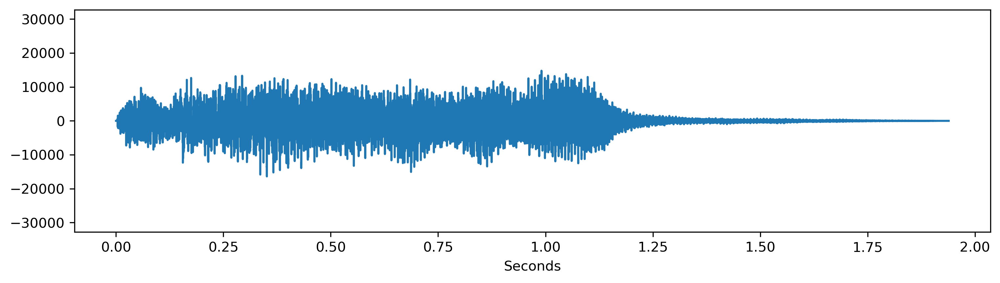

In [5]:
rate, samples = wavfile.read("tada.wav")
sw = SoundWave(rate,samples)
sw.plot()

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [6]:
IPython.display.Audio("tada.wav")

In [7]:
sw.export("notscaled.wav")
IPython.display.Audio("notscaled.wav")

In [8]:
sw.export("scaled.wav", force=True)
IPython.display.Audio("scaled.wav")

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [9]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    #Get the note and multiply by our rate
    length = duration * 44100
    #Create a domain
    t = np.linspace(0, duration, length)
    #Create the wave
    f = np.sin(2*np.pi*t*frequency)
    
    return SoundWave(44100,f)

In [10]:
sw1 = generate_note(440,2)
sw1.export("A.wav")
IPython.display.Audio("A.wav")

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [11]:
#Generate notes
A = generate_note(440,3)
C = generate_note(523.25,3)
E = generate_note(659.25,3)

#Add together, export and play
ACE = A+C+E
ACE.export("ACE.wav")
IPython.display.Audio("ACE.wav")

In [12]:
#Generate sounds
A = generate_note(440,1)
C = generate_note(523.25,1)
E = generate_note(659.25,1)

#Concatenate together, export and play
ACE = A>>C>>E
ACE.export("ACE.wav")
IPython.display.Audio("ACE.wav")

### Problem 1.5

- Implement `simple_dft()` with the formula $c=F_nf$, where $F_n$ is the n-dimensional DFT matrix.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [13]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    
    n = len(samples)
    Fn = 1/n * np.exp(-2j*np.pi/n* (np.arange(n)* np.arange(n).reshape(-1,1)))
    
    dft = Fn@samples
    
    return dft

In [14]:
#Test our function against scipy's
X = np.random.random(10)
C = fft(X)
c = simple_dft(X)*10

print(np.allclose(np.real(C),np.real(c)))


True


### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [15]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    
    
    n = len(samples)
    
    #Use the function from problem 5 for small enough samples
    if n <= threshold:
        return simple_dft(samples)

    else:
        #Get the DFT of Even and Odd entries seperately
        f_even = simple_fft(samples[::2])
        f_odd = simple_fft(samples[1::2])
        
        #Calculate the exponential parts of the sum
        w = np.exp((-2j * np.pi/n) * np.arange(n))
        
        first = f_even + w[:n//2] * f_odd
        second = f_even +w[n//2:] * f_odd
        
        return np.concatenate([first,second])
    

In [16]:
#Test our function against scipy's
test = np.random.random(8192)
scipy = fft(test)
c = simple_fft(test)
print(np.allclose(np.real(scipy),np.real(c)))

#Print the times for all three
print("Time for my DFT")
%time simple_dft(test)
print("Time for my FFT")
%time simple_fft(test)
print("Time for scipy FFT")
%time fft(test)

True
Time for my DFT
Wall time: 11.3 s
Time for my FFT
Wall time: 525 ms
Time for scipy FFT
Wall time: 2.71 ms


array([ 4.07063013e+03 -0.j        , -2.05815969e+01 +9.26303806j,
       -1.24540702e+01-69.08135808j, ...,  3.24373281e+00 +0.85110019j,
       -1.24540702e+01+69.08135808j, -2.05815969e+01 -9.26303806j])

### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

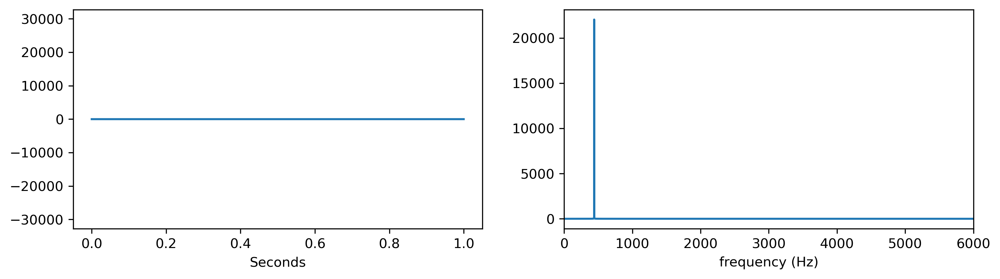

In [17]:
A = generate_note(440,1)
A.plot(True)

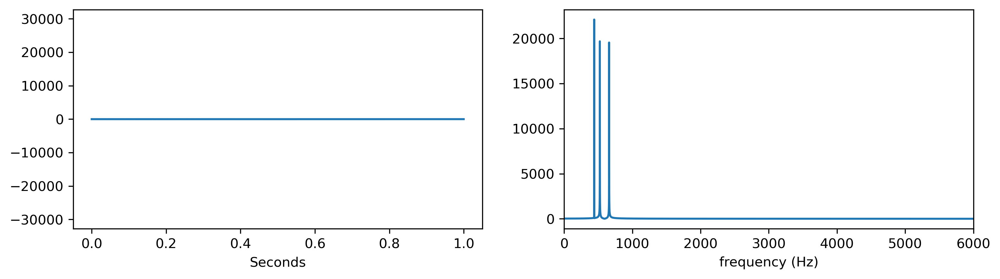

In [18]:
A = generate_note(440,1)
C = generate_note(523.25,1)
E = generate_note(659.25,1)

ACE = A+C+E
ACE.plot(True)

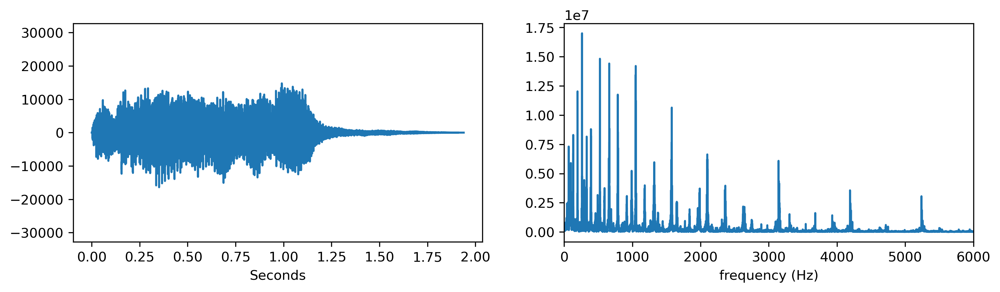

In [19]:
rate, samples = wavfile.read("tada.wav")
sw = SoundWave(rate,samples)
sw.plot(True)

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

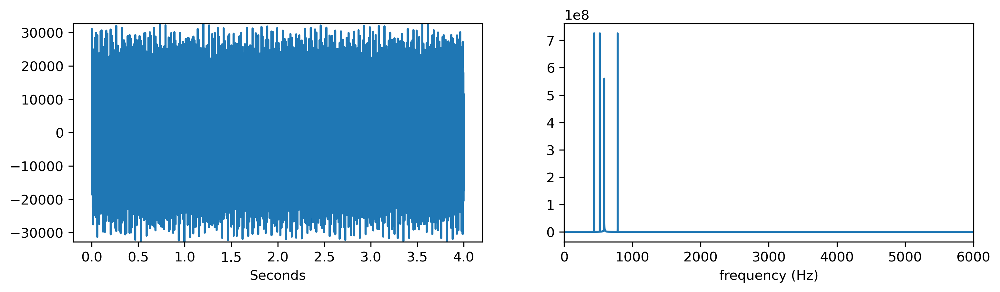

In [20]:
#Plot the mystery chord
rate,msamples = wavfile.read("mystery_chord.wav")
mrate = np.array(rate)
sw = SoundWave(rate,msamples)
sw.plot(True)

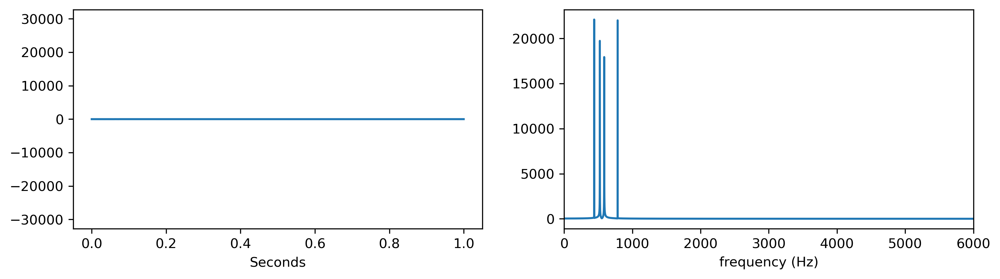

In [21]:
#Make a guess and see if our chord matches
A = generate_note(440,1)
C = generate_note(523.25,1)
D = generate_note(587.33,1)
G = generate_note(783.99,1)

ACDG = A+C+D+G
ACE.export("ACDG.wav")
#IPython.display.Audio("ACDG.wav")
ACDG.plot(True)

The notes are... A, C, D, and G

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [12]:
#Create white noise
rate = 22050
white_noise = np.random.randint(-32767,32767, rate*2, dtype=np.int16)
white = SoundWave(rate,white_noise)

#Import tada
rate, samples = wavfile.read("tada.wav")
tada = SoundWave(rate,samples)

#Convolve the two and embedd
convolve = white*tada
convolve.export("convolve.wav")
IPython.display.Audio("convolve.wav")

In [13]:
#Append convolved sound to itself and embed
convolved = convolve>>convolve
convolved.export("convolved.wav")
IPython.display.Audio("convolved.wav")

### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [30]:
#Embed CGC sound
rate, samples = wavfile.read("CGC.wav")
CGC = SoundWave(rate,samples)
IPython.display.Audio("CGC.wav")

In [31]:
#Embed GCG sound
rate,samples = wavfile.read("GCG.wav")
GCG = SoundWave(rate,samples)
IPython.display.Audio("GCG.wav")

In [28]:
#Find the time it takes for Scipy to convolve
print("Time for scipy convolution")
%time fftconvolve(CGC,GCG)

#Embed Scipy's conlved sound
X = fftconvolve(CGC,GCG)
X = SoundWave(rate,X)
X.export("X.wav")
IPython.display.Audio("X.wav")

Time for scipy convolution
Wall time: 27.3 ms


In [29]:
#Find the time it taeks for me to convolve
print("Time for my convolution")
%time CGC**GCG

#Embed my convolved sound
Y = CGC**GCG
Y.export("Y.wav")
IPython.display.Audio("Y.wav")

Time for my convolution
Wall time: 103 ms


### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [37]:
#Embed Chopin sound
rate,samples = wavfile.read("chopin.wav")
chopin = SoundWave(rate,samples)
IPython.display.Audio("chopin.wav")

In [33]:
#Embed Balloon sound
rate,samples = wavfile.read("balloon.wav")
balloon = SoundWave(rate,samples)
balloon.export("balloon.wav")
IPython.display.Audio("balloon.wav")

In [36]:
#Convolve Chopin and Balloon and Embed
X = fftconvolve(chopin,balloon)
X = SoundWave(rate,X)
X.export("prob3.wav")
IPython.display.Audio("prob3.wav")

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

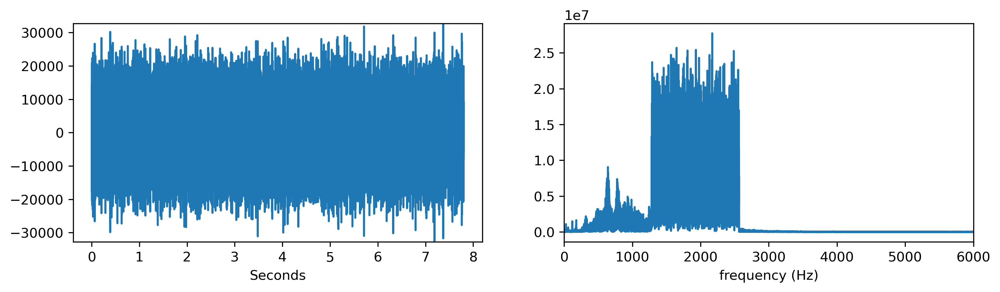

In [88]:
#Plot and Embed Noisy1.wav
rate, samples = wavfile.read("noisy1.wav")
noisy1 = SoundWave(rate,samples)
noisy1.plot(True)
IPython.display.Audio("noisy1.wav")

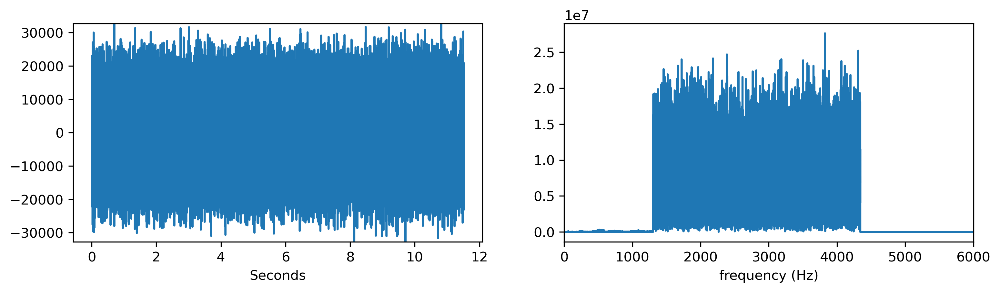

In [89]:
#Plot and Embed Noisy2.wav
rate, samples = wavfile.read("noisy2.wav")
noisy2 = SoundWave(rate,samples)
noisy2.plot(True)
IPython.display.Audio("noisy2.wav")

In [90]:
#Clean noisy1 at frequencies we see in DFT plot and Embed
clean1 = noisy1.clean(1250,2600)
clean1 = SoundWave(rate,clean1)
clean1.export("clean1.wav")
IPython.display.Audio("clean1.wav")

<ipython-input-87-ece19407ce16>:72: ComplexWarning: Casting complex values to real discards the imaginary part
  self.samples  = np.int16((self.samples / np.abs(np.max(self.samples))) * 32767)


In [94]:
#Clean noisy2 at frequencies we see in DFT plot and embed
clean2 = noisy2.clean(1250,4400)
clean2 = SoundWave(rate,clean2)
clean2.export("clean2.wav")
IPython.display.Audio("clean2.wav")

<ipython-input-87-ece19407ce16>:72: ComplexWarning: Casting complex values to real discards the imaginary part
  self.samples  = np.int16((self.samples / np.abs(np.max(self.samples))) * 32767)


### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [28]:
#Get Vuvuzela sound and split the two dimensions.
rate, samples = wavfile.read("vuvuzela.wav")
vuvu1 = samples[:,0]
vuvu2 = samples[:,1]

#make each its own soundwave and clean
vuvu1 = SoundWave(rate,vuvu1)
vuvu2 = SoundWave(rate,vuvu2)
clean1 = vuvu1.clean(200,500)
clean2 = vuvu2.clean(200,500)

In [29]:
#Recombine the two and create a new soundwave
cleanvuvu = np.column_stack((clean1,clean2))
cleanvuvu = SoundWave(rate,cleanvuvu)


In [30]:
#Embed the sound without the vuvu
cleanvuvu.export("cleanvuvu.wav")
IPython.display.Audio("cleanvuvu.wav")

<ipython-input-11-4b4c480ae680>:72: ComplexWarning: Casting complex values to real discards the imaginary part
  self.samples  = np.int16((self.samples / np.abs(np.max(self.samples))) * 32767)


### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

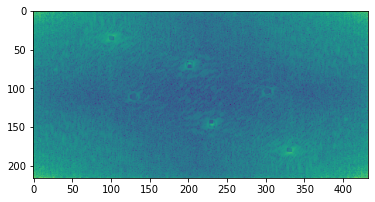

In [26]:
#Read in the image
image = imread("license_plate.png")

#Find the dft, mean, and shape of the image
imdft = fft2(image)
mean = np.mean(imdft)
m,n = image.shape

#Guess at the spikes from the plot of DFT
rows = [[34,39],[178,183],[109,114],[70,75],[100,108]]
colms =[[100,105],[330,335],[125,132],[200,205],[300,305]]

#Iterate through to clean up
for i in range(len(colms)):
    rb = rows[i][0]
    rt = rows[i][1]
    cb = colms[i][0]
    ct = colms[i][1]
    meant = np.mean(imdft[rb-5:rt-5,cb:ct])
    meanb = np.mean(imdft[rb+5:rt+5,cb:ct])
    meanr = np.mean(imdft[rb:rt,cb+5:ct+5])
    meanl = np.mean(imdft[rb:rt,cb-5:ct-5])
    totalmean = .25*(meant + meanb + meanr + meanl)
    imdft[rb:rt,cb:ct] = totalmean
    imdft[m-rt:m-rb,n-ct:n-cb] = totalmean
    
#Show the dft plot of the image
plt.imshow(np.log(np.abs(imdft)))
plt.show()

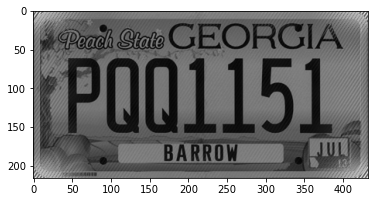

In [27]:
#Show the cleaned
new = ifft2(imdft).real
plt.imshow(new,cmap="gray")
plt.show()

The year on the sticker is... 2013